# Project 4 - Predict West Nile Virus

## 3. EDA and Feature Engineering

## Content
- [Problem Statement](#Problem-Statement)
- [Executive Summary](#Executive-Summary)
- [Importing Libraries and dataset](#Importing-Libraries-and-dataset)
- [EDA and Feature Engineering](#EDA-and-Feature-Engineering)

## Problem Statement

With the surgence of the West Nile Virus in the city of Chicago, The Chicago Department of Public Health (CDPH) has decided to establish a comprehensive surveillance and control program to monitor the situation of the West Nile Virus epidemic in the city. The city officials from the CDPH's Disease And Treatment Agency have decided to step up control measures through the usage of fogging/pesticide coverage so as to control the outbreak of the West Nile Virus. With the purpose of controlling the epidemic, we have been hired by CDPH to analyse past data of West Nile Virus outbreaks, get insights on how to control this public health threat, and analyse the costs (as well as the benefits) on the usage of pesticide coverage for the control of West Nile Virus. Working with the data provided by the Disease And Treatment Agency, we will be predicting which areas are most likely to contain the West Nile Virus given their weather conditions and time variables. To choose our final classification model, we will be comparing the models' ROC_AUC scores (and recall rates if there are two or more models that performed similarly in the ROC_AUC metric). 

Ultimately, we aim to provide a model that can accurately predict whether an area has the West Nile Virus, highlighting the most important conditions that leads to a higher probability of the West Nile Virus at a certain area/location. After gaining insights on the most important features as prioritised by the model, this will be followed by an in-depth cost and benefit analysis of pesticide converage on certain WNV-predicted areas and then paired with recommendations for CDPH on suitable West Nile Virus control efforts in the city of Chicago; therefore helping CDPH in their West Nile Virus surveillance and control efforts in the city of Chicago.

## Executive Summary

With the rising public health threat of the West Nile Virus in the city of Chicago, the Chicago Department of Public Health (CDPH) has established a comprehensive surveillance and control program to monitor and manage the escalating situation. With CDPH's Disease And Treatment Agency moving to step up control measures through pesticide coverage/fogging, our team has been tasked to create a prediction model that predicts locations with West Nile Virus while also identifying conditions that leads to a higher probability of the virus. Through predictive modelling, areas with the presence of the West Nile Virus wll be predicted and identified (with WNV-present denoted as 1 and WNV-absent denoted as 0) given certain weather and seasonal conditions.

Using the data we got from the city of Chicago, we cleaned and engineered the features to our suitability. After which, we fit the features into a logistic regression model as our baseline model, and compared the results with our other two classification models, Random Forest and XGBoost (executed with GridSearch for hyper-parameter tuning) for model selection purposes. As there are imbalanced datasets, the models are evaluated based on the ROC_AUC metric (and then later on their recall rate to minimise false negatives since West Nile Virus is viewed as an increasing public health threat in Chicago). After comparing the ROC_AUC scores of both models with their recall rates, we have decided to choose the Random Forest model as our final prediction model.

Through exploratory data analysis and the study of our most important features as generated by our chosen model, we have found out that most features that highly affect the presence of West Nile Virus at a location are weather-related (e.g. temperature), location-related (e.g. near WNV hot spots) and season-related (i.e. months). 

This is followed by recommendations for controlling the West Nile Virus epidemic in Chicago:
- Execute fogging/pesticide spraying on current West Nile Virus hot spots
- Consider fogging on areas that experience high temperatures during the summer
- Study and execute more research on mosquito species with higher probability of West Nile Virus
- Develop an app that highlights the current WNV hotspots
- Increase public awareness of West Nile Virus when the risk of contracting the virus is high
- Study and identify unknown mosquito species

Due to the high ROC_AUC and recall rates, we are highly confident that by adopting our model, the City of Chicago is able to identify potential WNV-present locations. By doing so, the city will be able to mitigate the spread of the WNV by targeting pesticide spraying efforts in these locations. Moving forward, the model can be continuously calibrated with more data so that that the model performance can improve overtime. Additional data related to various building information (e.g. drainage systems, pot holes, pools) can also be added to the model so as to provide us with insights on the breeding origin of the mosquitos while also improving the performance of the model. In the future, the model can potentially be utilised elsewhere to solve other social or business-related problems, such as by local shopowners to make informed restocking decisions on mosquito-repellent products, and public health researchers for West Nile Virus research-related purposes.

## Importing Libraries and dataset

In [1]:
# !pip install plotly
# !pip install geopy
# If you didnt install these libraries

In [2]:
# Importing libraries
import numpy as np
import pandas as pd
import scipy as sp
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import plotly.express as px

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

from geopy import distance

In [3]:
# retrieving datasets
weather = pd.read_csv('../assets/weather_cleaned.csv')
train = pd.read_csv('../assets/train_cleaned.csv')
test = pd.read_csv('../assets/test_cleaned.csv')

In [4]:
weather.head()
# weather dataset after cleaning

,date,station_1,tmax_1,tmin_1,tavg_1,depart_1,dewpoint_1,wetbulb_1,heat_1,cool_1,...,90day_tavg,tmin_avg,14day_tmin,28day_tmin,tmax_avg,14day_tmax,28day_tmax,dew_avg,14day_dew,28day_dew
0,2007-05-01,1,83,50,67.0,14.0,51,56.0,0.0,2.0,...,67.500000,51.0,51.0,51.0,83.5,83.5,83.5,51.0,51.000000,51.000000
1,2007-05-02,1,59,42,51.0,-3.0,42,47.0,14.0,0.0,...,59.500000,42.5,42.5,42.5,59.5,83.5,83.5,42.0,46.500000,46.500000
2,2007-05-03,1,66,46,56.0,2.0,40,48.0,9.0,0.0,...,58.666667,47.0,42.5,42.5,66.5,83.5,83.5,40.0,44.333333,44.333333
3,2007-05-04,1,66,49,58.0,4.0,41,50.0,7.0,0.0,...,59.312500,50.0,42.5,42.5,72.0,83.5,83.5,41.5,43.625000,43.625000
4,2007-05-05,1,66,53,60.0,5.0,38,49.0,5.0,0.0,...,59.450000,53.5,42.5,42.5,66.0,83.5,83.5,38.5,42.600000,42.600000


In [5]:
weather.columns

Index(['date', 'station_1', 'tmax_1', 'tmin_1', 'tavg_1', 'depart_1',
       'dewpoint_1', 'wetbulb_1', 'heat_1', 'cool_1', 'sunrise_1', 'sunset_1',
       'preciptotal_1', 'stnpressure_1', 'sealevel_1', 'resultspeed_1',
       'resultdir_1', 'avgspeed_1', 'year', 'month', 'day', 'station_2',
       'tmax_2', 'tmin_2', 'tavg_2', 'depart_2', 'dewpoint_2', 'wetbulb_2',
       'heat_2', 'cool_2', 'sunrise_2', 'sunset_2', 'preciptotal_2',
       'stnpressure_2', 'sealevel_2', 'resultspeed_2', 'resultdir_2',
       'avgspeed_2', 'precip_avg', '14day_precip', '28day_precip',
       '90day_precip', 'temp_avg', '14day_tavg', '28day_tavg', '90day_tavg',
       'tmin_avg', '14day_tmin', '28day_tmin', 'tmax_avg', '14day_tmax',
       '28day_tmax', 'dew_avg', '14day_dew', '28day_dew'],
      dtype='object')

In [6]:
train.head()
# train dataset after cleaning

,date,species,trap,latitude,longitude,wnvpresent,nummosquitos,year,month,day
0,2007-05-29,CULEX PIPIENS/RESTUANS,T048,41.867108,-87.654224,0,1,2007,5,29
1,2007-05-29,CULEX RESTUANS,T048,41.867108,-87.654224,0,2,2007,5,29
2,2007-05-29,CULEX RESTUANS,T091,41.862292,-87.648860,0,1,2007,5,29
3,2007-05-29,CULEX RESTUANS,T049,41.896282,-87.655232,0,1,2007,5,29
4,2007-05-29,CULEX RESTUANS,T153,41.907645,-87.760886,0,1,2007,5,29


In [7]:
train.columns

Index(['date', 'species', 'trap', 'latitude', 'longitude', 'wnvpresent',
       'nummosquitos', 'year', 'month', 'day'],
      dtype='object')

In [8]:
test.head()
# test dataset after cleaning

,id,date,species,trap,latitude,longitude,year,month,day
0,1,2008-06-11,CULEX PIPIENS/RESTUANS,T002,41.95469,-87.800991,2008,6,11
1,2,2008-06-11,CULEX RESTUANS,T002,41.95469,-87.800991,2008,6,11
2,3,2008-06-11,CULEX PIPIENS,T002,41.95469,-87.800991,2008,6,11
3,4,2008-06-11,CULEX SALINARIUS,T002,41.95469,-87.800991,2008,6,11
4,5,2008-06-11,CULEX TERRITANS,T002,41.95469,-87.800991,2008,6,11


In [9]:
test.columns

Index(['id', 'date', 'species', 'trap', 'latitude', 'longitude', 'year',
       'month', 'day'],
      dtype='object')

## EDA and Feature Engineering

In [10]:
weather['day_sin'] = np.sin(weather['day']*2*(np.pi/24))
weather['day_cos'] = np.cos(weather['day']*2*(np.pi/24))
weather['mth_sin'] = np.sin((weather['month']-1)*2*(np.pi/24))
weather['mth_cos'] = np.cos((weather['month']-1)*2*(np.pi/24))
# Map cyclical features into a circle such that lowest value for the variable appears right next to the largest value 
# http://blog.davidkaleko.com/feature-engineering-cyclical-features.html

In [11]:
def station_dist1(data):
    station1 = (41.995,-87.933)
    station2 = (41.786,-87.752)
    location_trap = (data.latitude, data.longitude)
    dist_station1 = distance.distance(station1, location_trap).km
    dist_station2 = distance.distance(station2, location_trap).km
    ratio_dist = dist_station1 + dist_station2
    return dist_station1/ratio_dist

def station_dist2(data):
    station1 = (41.995,-87.933)
    station2 = (41.786,-87.752)
    location_trap = (data.latitude, data.longitude)
    dist_station1 = distance.distance(station1, location_trap).km
    dist_station2 = distance.distance(station2, location_trap).km
    ratio_dist = dist_station1 + dist_station2
    return dist_station2/ratio_dist

In [12]:
#calculate distance of trap from station 1 and add as new column distance_1
train['distance_1'] = train.apply(station_dist1, axis=1)
test['distance_1'] = test.apply(station_dist1, axis=1)

#calculate distance of trap from station 2 and add as new column distance_2
train['distance_2'] = train.apply(station_dist2, axis=1)
test['distance_2'] = test.apply(station_dist2, axis=1)

In [13]:
train.columns

Index(['date', 'species', 'trap', 'latitude', 'longitude', 'wnvpresent',
       'nummosquitos', 'year', 'month', 'day', 'distance_1', 'distance_2'],
      dtype='object')

In [14]:
test.columns

Index(['id', 'date', 'species', 'trap', 'latitude', 'longitude', 'year',
       'month', 'day', 'distance_1', 'distance_2'],
      dtype='object')

In [15]:
# Merging weather and train/test data together for analysis and feature engineering
train = train.merge(weather, how = 'left', on = 'date')
test = test.merge(weather, how = 'left', on = 'date')

In [16]:
train.head()

,date,species,trap,latitude,longitude,wnvpresent,nummosquitos,year_x,month_x,day_x,...,tmax_avg,14day_tmax,28day_tmax,dew_avg,14day_dew,28day_dew,day_sin,day_cos,mth_sin,mth_cos
0,2007-05-29,CULEX PIPIENS/RESTUANS,T048,41.867108,-87.654224,0,1,2007,5,29,...,88.0,89.0,90.0,58.5,45.357143,44.642857,0.965926,0.258819,0.866025,0.5
1,2007-05-29,CULEX RESTUANS,T048,41.867108,-87.654224,0,2,2007,5,29,...,88.0,89.0,90.0,58.5,45.357143,44.642857,0.965926,0.258819,0.866025,0.5
2,2007-05-29,CULEX RESTUANS,T091,41.862292,-87.648860,0,1,2007,5,29,...,88.0,89.0,90.0,58.5,45.357143,44.642857,0.965926,0.258819,0.866025,0.5
3,2007-05-29,CULEX RESTUANS,T049,41.896282,-87.655232,0,1,2007,5,29,...,88.0,89.0,90.0,58.5,45.357143,44.642857,0.965926,0.258819,0.866025,0.5
4,2007-05-29,CULEX RESTUANS,T153,41.907645,-87.760886,0,1,2007,5,29,...,88.0,89.0,90.0,58.5,45.357143,44.642857,0.965926,0.258819,0.866025,0.5


In [17]:
train.columns

Index(['date', 'species', 'trap', 'latitude', 'longitude', 'wnvpresent',
       'nummosquitos', 'year_x', 'month_x', 'day_x', 'distance_1',
       'distance_2', 'station_1', 'tmax_1', 'tmin_1', 'tavg_1', 'depart_1',
       'dewpoint_1', 'wetbulb_1', 'heat_1', 'cool_1', 'sunrise_1', 'sunset_1',
       'preciptotal_1', 'stnpressure_1', 'sealevel_1', 'resultspeed_1',
       'resultdir_1', 'avgspeed_1', 'year_y', 'month_y', 'day_y', 'station_2',
       'tmax_2', 'tmin_2', 'tavg_2', 'depart_2', 'dewpoint_2', 'wetbulb_2',
       'heat_2', 'cool_2', 'sunrise_2', 'sunset_2', 'preciptotal_2',
       'stnpressure_2', 'sealevel_2', 'resultspeed_2', 'resultdir_2',
       'avgspeed_2', 'precip_avg', '14day_precip', '28day_precip',
       '90day_precip', 'temp_avg', '14day_tavg', '28day_tavg', '90day_tavg',
       'tmin_avg', '14day_tmin', '28day_tmin', 'tmax_avg', '14day_tmax',
       '28day_tmax', 'dew_avg', '14day_dew', '28day_dew', 'day_sin', 'day_cos',
       'mth_sin', 'mth_cos'],
      dtype=

In [18]:
test.head()

,id,date,species,trap,latitude,longitude,year_x,month_x,day_x,distance_1,...,tmax_avg,14day_tmax,28day_tmax,dew_avg,14day_dew,28day_dew,day_sin,day_cos,mth_sin,mth_cos
0,1,2008-06-11,CULEX PIPIENS/RESTUANS,T002,41.95469,-87.800991,2008,6,11,0.381418,...,86.0,87.5,87.5,55.5,58.607143,49.285714,0.258819,-0.965926,0.965926,0.258819
1,2,2008-06-11,CULEX RESTUANS,T002,41.95469,-87.800991,2008,6,11,0.381418,...,86.0,87.5,87.5,55.5,58.607143,49.285714,0.258819,-0.965926,0.965926,0.258819
2,3,2008-06-11,CULEX PIPIENS,T002,41.95469,-87.800991,2008,6,11,0.381418,...,86.0,87.5,87.5,55.5,58.607143,49.285714,0.258819,-0.965926,0.965926,0.258819
3,4,2008-06-11,CULEX SALINARIUS,T002,41.95469,-87.800991,2008,6,11,0.381418,...,86.0,87.5,87.5,55.5,58.607143,49.285714,0.258819,-0.965926,0.965926,0.258819
4,5,2008-06-11,CULEX TERRITANS,T002,41.95469,-87.800991,2008,6,11,0.381418,...,86.0,87.5,87.5,55.5,58.607143,49.285714,0.258819,-0.965926,0.965926,0.258819


In [19]:
test.columns

Index(['id', 'date', 'species', 'trap', 'latitude', 'longitude', 'year_x',
       'month_x', 'day_x', 'distance_1', 'distance_2', 'station_1', 'tmax_1',
       'tmin_1', 'tavg_1', 'depart_1', 'dewpoint_1', 'wetbulb_1', 'heat_1',
       'cool_1', 'sunrise_1', 'sunset_1', 'preciptotal_1', 'stnpressure_1',
       'sealevel_1', 'resultspeed_1', 'resultdir_1', 'avgspeed_1', 'year_y',
       'month_y', 'day_y', 'station_2', 'tmax_2', 'tmin_2', 'tavg_2',
       'depart_2', 'dewpoint_2', 'wetbulb_2', 'heat_2', 'cool_2', 'sunrise_2',
       'sunset_2', 'preciptotal_2', 'stnpressure_2', 'sealevel_2',
       'resultspeed_2', 'resultdir_2', 'avgspeed_2', 'precip_avg',
       '14day_precip', '28day_precip', '90day_precip', 'temp_avg',
       '14day_tavg', '28day_tavg', '90day_tavg', 'tmin_avg', '14day_tmin',
       '28day_tmin', 'tmax_avg', '14day_tmax', '28day_tmax', 'dew_avg',
       '14day_dew', '28day_dew', 'day_sin', 'day_cos', 'mth_sin', 'mth_cos'],
      dtype='object')

In [20]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 116293 entries, 0 to 116292
Data columns (total 69 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   id             116293 non-null  int64  
 1   date           116293 non-null  object 
 2   species        116293 non-null  object 
 3   trap           116293 non-null  object 
 4   latitude       116293 non-null  float64
 5   longitude      116293 non-null  float64
 6   year_x         116293 non-null  int64  
 7   month_x        116293 non-null  int64  
 8   day_x          116293 non-null  int64  
 9   distance_1     116293 non-null  float64
 10  distance_2     116293 non-null  float64
 11  station_1      116293 non-null  int64  
 12  tmax_1         116293 non-null  int64  
 13  tmin_1         116293 non-null  int64  
 14  tavg_1         116293 non-null  float64
 15  depart_1       116293 non-null  float64
 16  dewpoint_1     116293 non-null  int64  
 17  wetbulb_1      116293 non-nul

In [21]:
#columns in which we want to get weighted averages
columns = ['tmax','tmin','tavg', 'depart', 'dewpoint', 'wetbulb', 'heat', 'cool', 'preciptotal', 'stnpressure', 'sealevel', 'resultspeed',
          'resultdir', 'avgspeed']

In [22]:
#creating new columns that contain weighted averages of each variable from columns
for col in columns:
    train[col] = train.apply(lambda df : df['distance_1']*df[col+'_1'] + df['distance_2']*df[col+'_2'] , axis = 1)
    test[col] = test.apply(lambda df : df['distance_1']*df[col+'_1'] + df['distance_2']*df[col+'_2'] , axis = 1)

In [23]:
#create daylight column by getting time difference between sunrise and sunset
train['daylight'] = (train['sunset_1'].astype(int) - train['sunrise_1'].astype(int))/100
test['daylight'] = (test['sunset_1'].astype(int) - test['sunrise_1'].astype(int))/100

In [24]:
train.drop(columns = ['distance_1', 'distance_2', 'station_1', 'tmax_1', 'tmin_1', 'tavg_1', 'depart_1',
       'dewpoint_1', 'wetbulb_1', 'heat_1', 'cool_1', 'sunrise_1', 'sunset_1',
       'preciptotal_1', 'stnpressure_1', 'sealevel_1', 'resultspeed_1', 'resultdir_1',
       'avgspeed_1', 'year_y', 'month_y', 'day_y', 'station_2', 'tmax_2',
       'tmin_2', 'tavg_2', 'depart_2', 'dewpoint_2', 'wetbulb_2', 'heat_2', 'cool_2',
       'sunrise_2', 'sunset_2', 'preciptotal_2', 'stnpressure_2', 'sealevel_2', 'resultspeed_2', 'resultdir_2',
       'avgspeed_2'], inplace=True, axis = 1)

train.rename(columns = {'year_x':'year', 'month_x':'month','day_x':'day'},inplace = True)

test.drop(columns = ['distance_1', 'distance_2', 'station_1', 'tmax_1', 'tmin_1', 'tavg_1', 'depart_1',
       'dewpoint_1', 'wetbulb_1', 'heat_1', 'cool_1', 'sunrise_1', 'sunset_1',
       'preciptotal_1', 'stnpressure_1', 'sealevel_1', 'resultspeed_1', 'resultdir_1',
       'avgspeed_1', 'year_y', 'month_y', 'day_y', 'station_2', 'tmax_2',
       'tmin_2', 'tavg_2', 'depart_2', 'dewpoint_2', 'wetbulb_2', 'heat_2', 'cool_2',
       'sunrise_2', 'sunset_2', 'preciptotal_2', 'stnpressure_2', 'sealevel_2', 'resultspeed_2', 'resultdir_2',
       'avgspeed_2'], inplace=True, axis = 1)

test.rename(columns = {'year_x':'year', 'month_x':'month','day_x':'day'},inplace = True)

In [25]:
#get days since last rained
def days_last_rained(df):
    rainy_days = 0
    list_rainy = []
    for i in range(df.shape[0]):
        if df.loc[i,'preciptotal'] == 0:
            rainy_days += 1 
            list_rainy.append(rainy_days)
        else:
            rainy_days = 0
            list_rainy.append(rainy_days)
    return list_rainy

In [26]:
train_rained = pd.DataFrame(days_last_rained(train), columns=['last_rained'])
test_rained = pd.DataFrame(days_last_rained(test), columns=['last_rained'])

In [27]:
train = pd.concat([train, train_rained], axis=1)
test = pd.concat([test, test_rained], axis=1)
# getting days since last rain into dataset

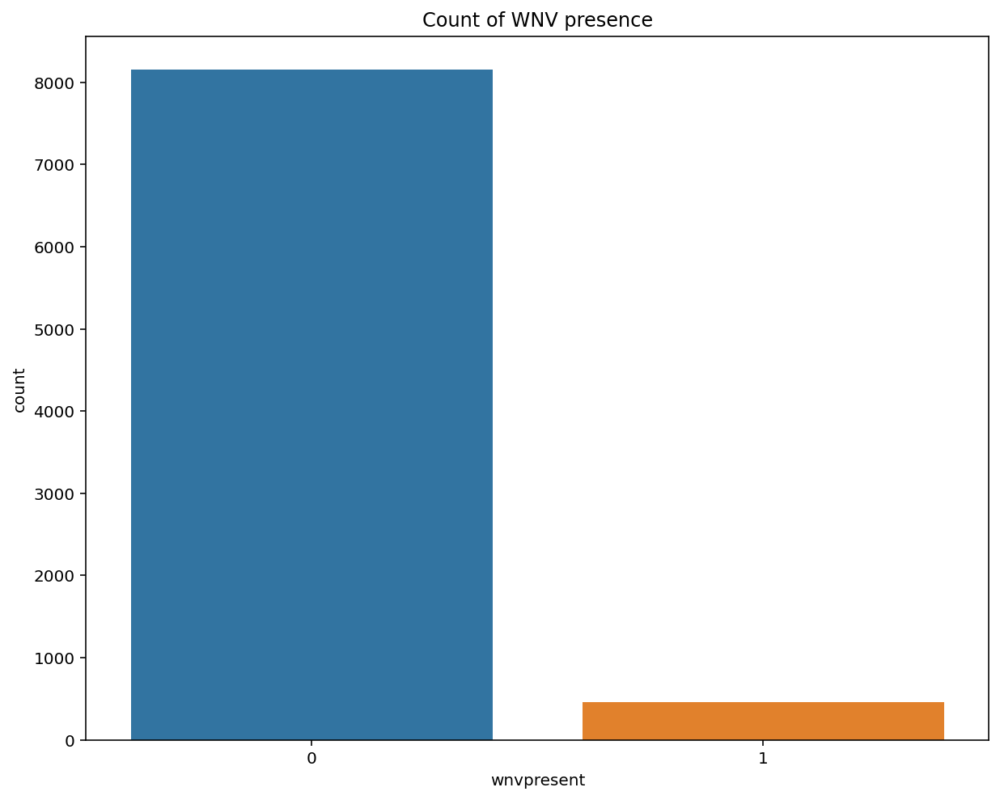

In [28]:
plt.figure(figsize = [10,8]);
sns.countplot(train['wnvpresent']);
plt.title('Count of WNV presence');
# clearly imbalanced dataset, we will try different approach to deal with imbalance data

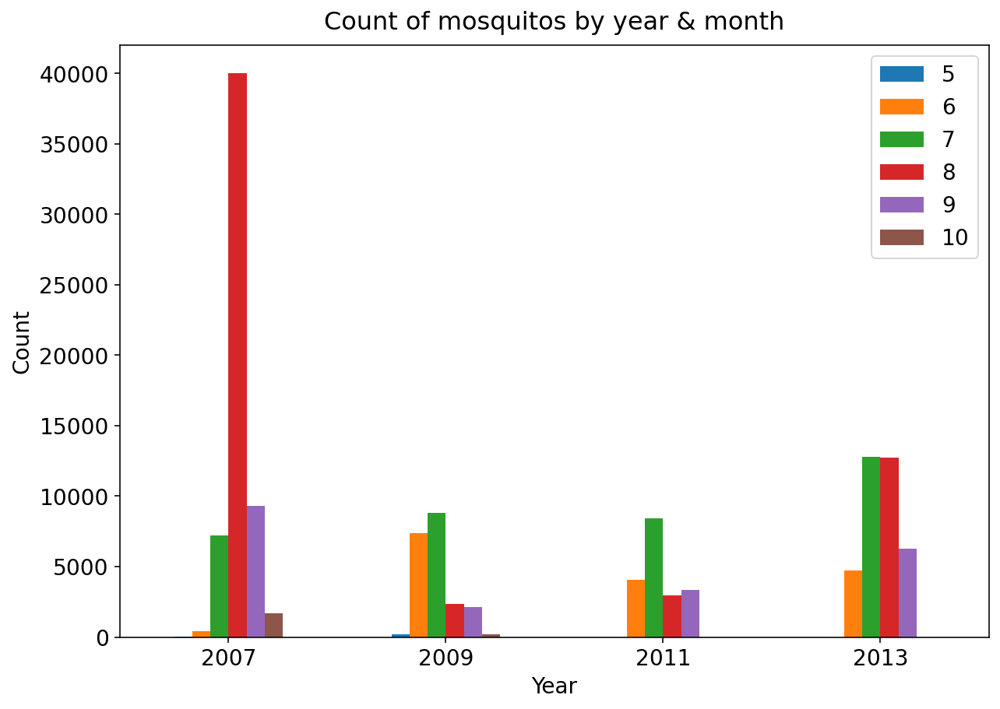

In [29]:
train.groupby(['year','month']).nummosquitos.sum().unstack(fill_value=0).plot.bar(figsize=(10,7));
plt.xticks(rotation=0, fontsize=14);
plt.yticks(fontsize=14);
plt.title('Count of mosquitos by year & month', fontsize=16, y=1.01);
plt.ylabel('Count', fontsize=14);
plt.xlabel('Year',fontsize=14);
plt.legend(fontsize=14);
plt.show();

# count of mosquitos by year and month.
# Clearly 2007 has the highest count and the heaviest hit months are between June and Sept across the years

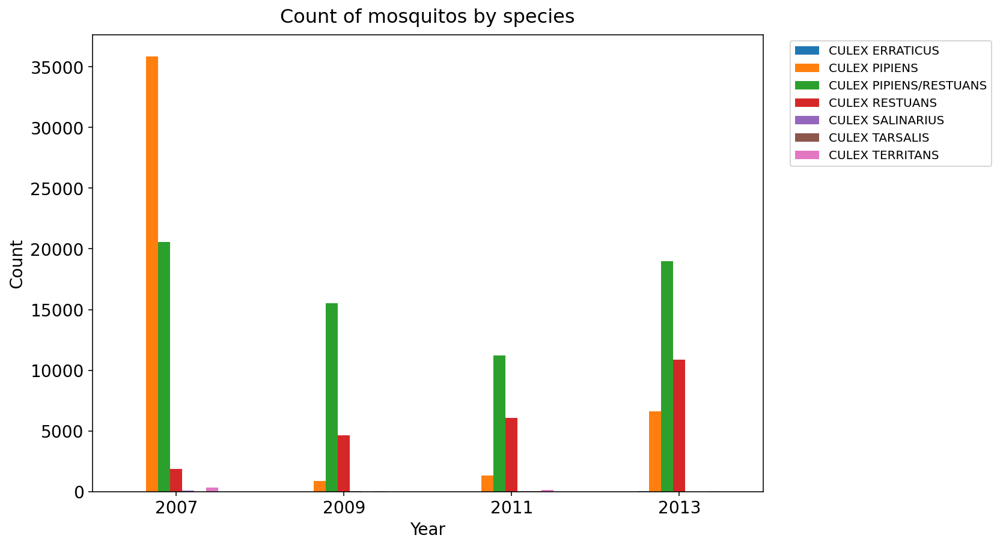

In [30]:
train.groupby(['year','species']).nummosquitos.sum().unstack(fill_value=0).plot.bar(figsize=(10,7));
plt.xticks(rotation=0, fontsize=14);
plt.yticks(fontsize=14);
plt.title('Count of mosquitos by species', fontsize=16, y=1.01);
plt.ylabel('Count', fontsize=14);
plt.xlabel('Year',fontsize=14);
plt.legend(fontsize=10, bbox_to_anchor = (1.35, 1));
plt.show();

# Count of mosquitoes by species. Culex Pipiens had the worst outbreak in 2007 but numbers decreased over time
# Culex Restuans shows an increasing trend
# Culex Pipiens/Restuans remains high over the years

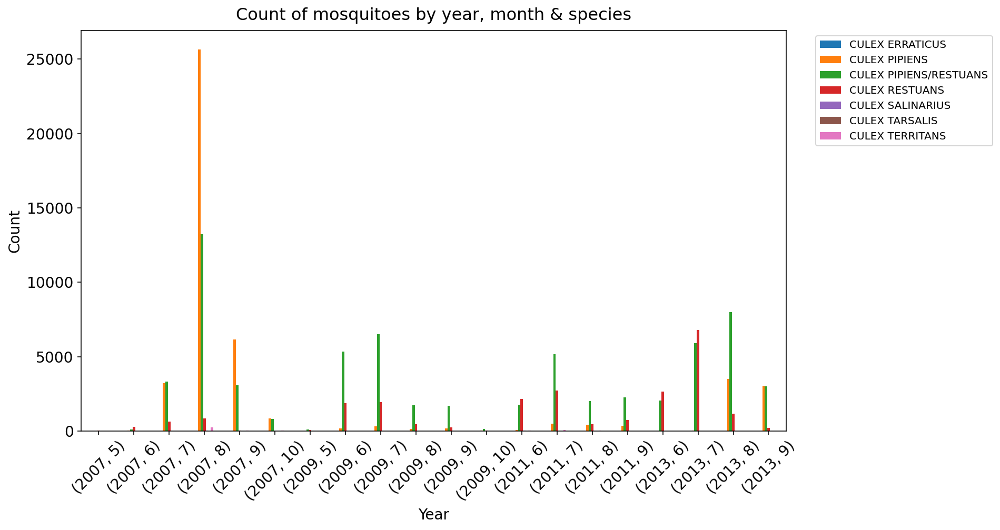

In [31]:
train.groupby(['year','month', 'species']).nummosquitos.sum().unstack(fill_value=0).plot.bar(figsize=(12,7))
plt.xticks(rotation=45, fontsize=14);
plt.yticks(fontsize=14);
plt.title('Count of mosquitoes by year, month & species', fontsize=16, y=1.01);
plt.ylabel('Count', fontsize=14);
plt.xlabel('Year',fontsize=14);
plt.legend(fontsize=10, bbox_to_anchor = (1.3, 1));
plt.show();

# Culex pipiens outbreak in 2007 remains the heaviest hit year in terms of count
# Culex Restuans increasing trend is something to worry about
# Culex Pipens/Restuans remains high over the years and is the highest risk of all species

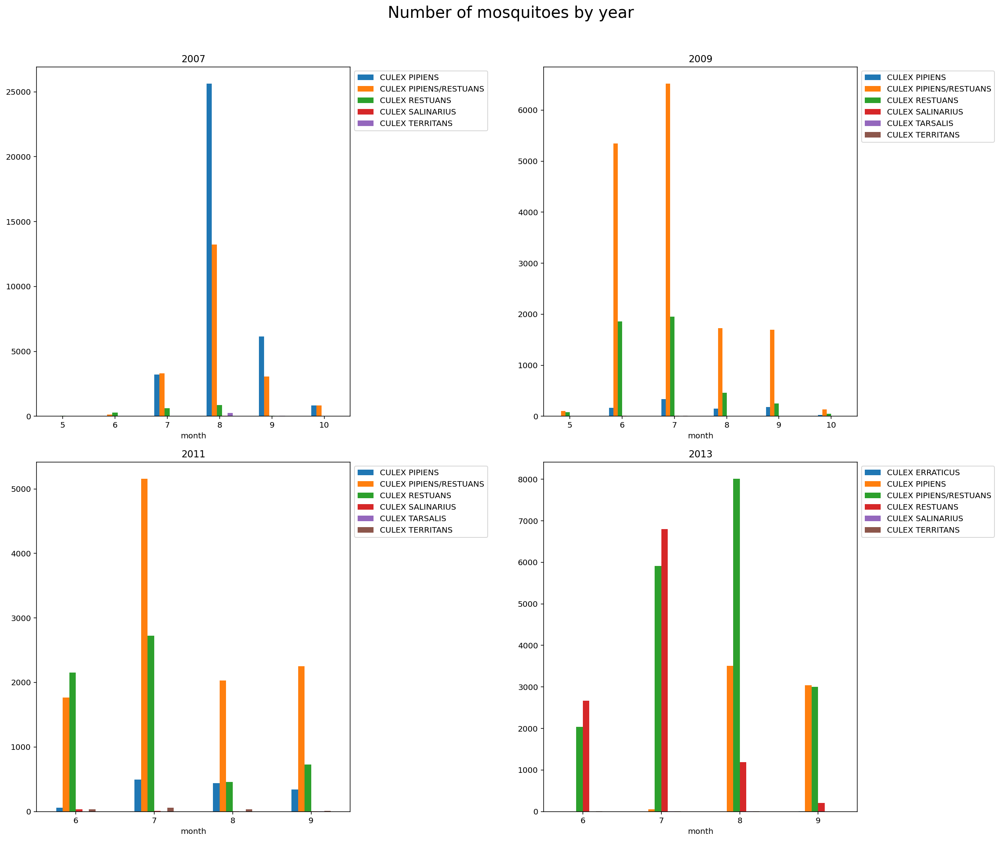

In [32]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(18,14));
ax = ax.ravel();
plt.suptitle('Number of mosquitoes by year', fontsize=20, y=1.05);
for i, y in enumerate(train.year.unique()):
    train[train['year']==y].groupby(['month', 'species']).nummosquitos.sum().unstack(fill_value=0).plot.bar(ax=ax[i]);
    ax[i].set_title(y);
    ax[i].tick_params(axis='x', labelrotation=0);

ax[0].legend(fontsize=10, bbox_to_anchor = (1.45, 1));
ax[1].legend(fontsize=10, bbox_to_anchor = (1.45, 1));
ax[2].legend(fontsize=10, bbox_to_anchor = (1.45, 1));
ax[3].legend(fontsize=10, bbox_to_anchor = (1.45, 1));


plt.tight_layout();

# same as above but can see the breakdown more clearly
# New species of mosquito found from 2009 but count remains low

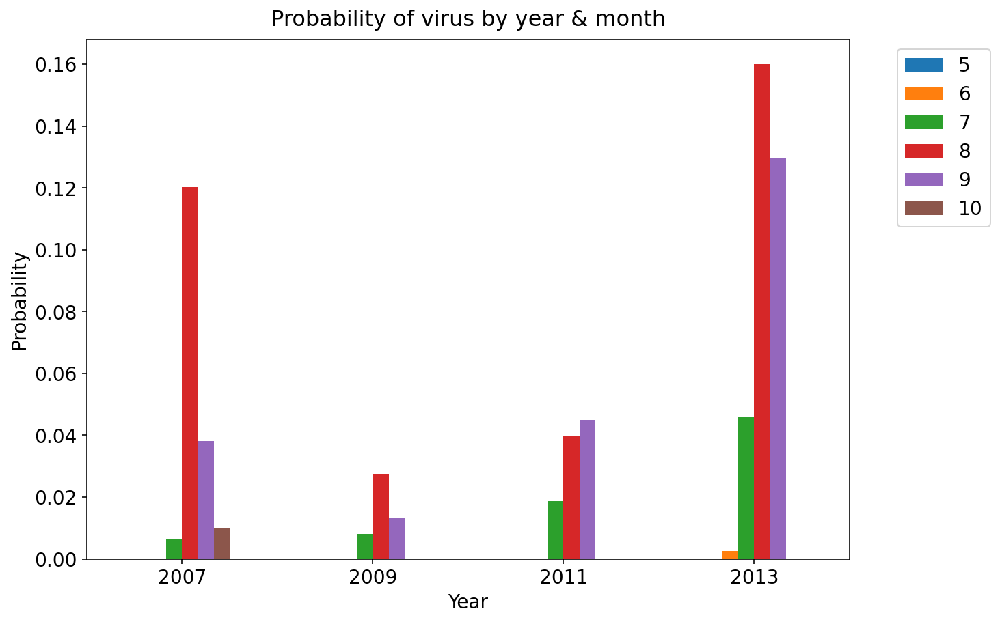

In [33]:
train.groupby(['year','month']).wnvpresent.mean().unstack(fill_value=0).plot.bar(figsize=(10,7));
plt.xticks(rotation=0, fontsize=14);
plt.yticks(fontsize=14);
plt.title('Probability of virus by year & month', fontsize=16, y=1.01);
plt.ylabel('Probability', fontsize=14);
plt.xlabel('Year',fontsize=14);
plt.legend(fontsize=14, bbox_to_anchor = (1.05, 1));
plt.show();

# Highest percentage of virus occuring in Aug, Sep which is a delay from the highest number of mosquitos
# 2007 has a high risk of WNV presence found in mosquitos, probably due to the Culex Pipens outbreak
# 2013 has the highest risk of WNV presence found in mosquitos. Increasing trend since 2009

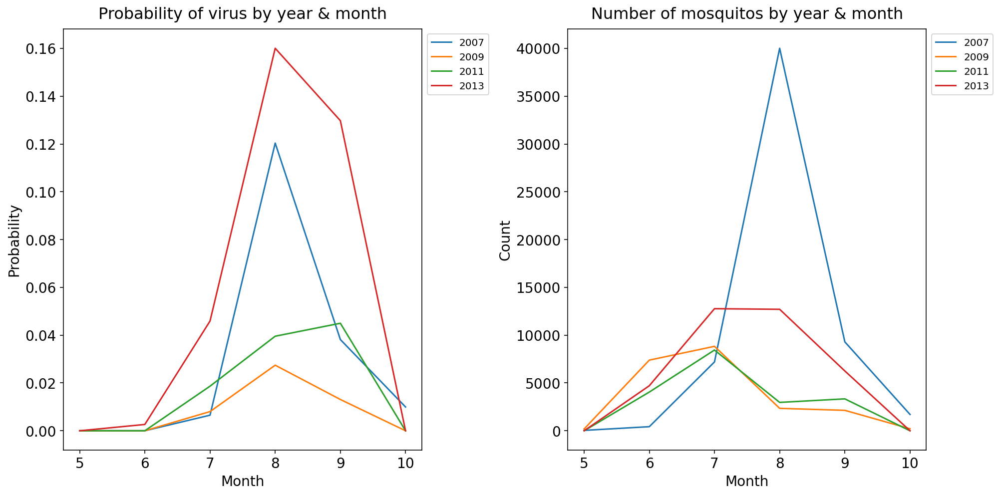

In [34]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14,7));
ax = ax.ravel();
train.groupby(['month', 'year']).wnvpresent.mean().unstack(fill_value=0).plot(ax=ax[0]);
train.groupby(['month', 'year']).nummosquitos.sum().unstack(fill_value=0).plot(ax=ax[1]);

ax[0].set_title('Probability of virus by year & month', fontsize=16, y=1.01);
ax[0].set_ylabel('Probability', fontsize=14);
ax[0].set_xlabel('Month',fontsize=14);
ax[0].tick_params(labelsize=14);
ax[0].legend(fontsize=10, bbox_to_anchor = (1.2, 1));

ax[1].set_title('Number of mosquitos by year & month', fontsize=16, y=1.01);
ax[1].set_ylabel('Count', fontsize=14);
ax[1].set_xlabel('Month',fontsize=14);
ax[1].tick_params(labelsize=14);
ax[1].legend(fontsize=10, bbox_to_anchor = (1.2, 1));

fig.tight_layout();

# Highest probability of virus in Aug except for 2011, where highest probability of virus was in Sep
# Higher number of mosquito does not indicate higher probability of virus 

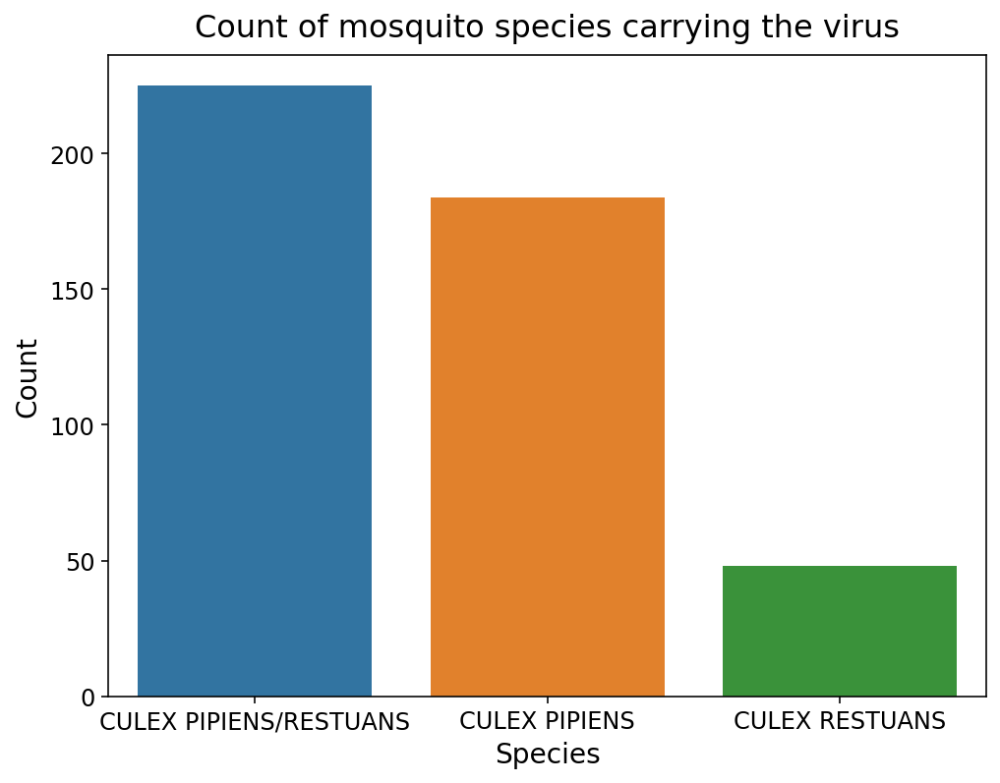

In [35]:
plt.figure(figsize=(8,6));
sns.countplot(train[train['wnvpresent']==1].species);
plt.title('Count of mosquito species carrying the virus', fontsize=16, y=1.01);
plt.tick_params(labelsize=12);
plt.xlabel('Species', fontsize=14);
plt.ylabel('Count', fontsize=14);
plt.show();

# 3 species found with WNV. Culex Pipens/Restuans  and Culex Pipiens are the highest risk

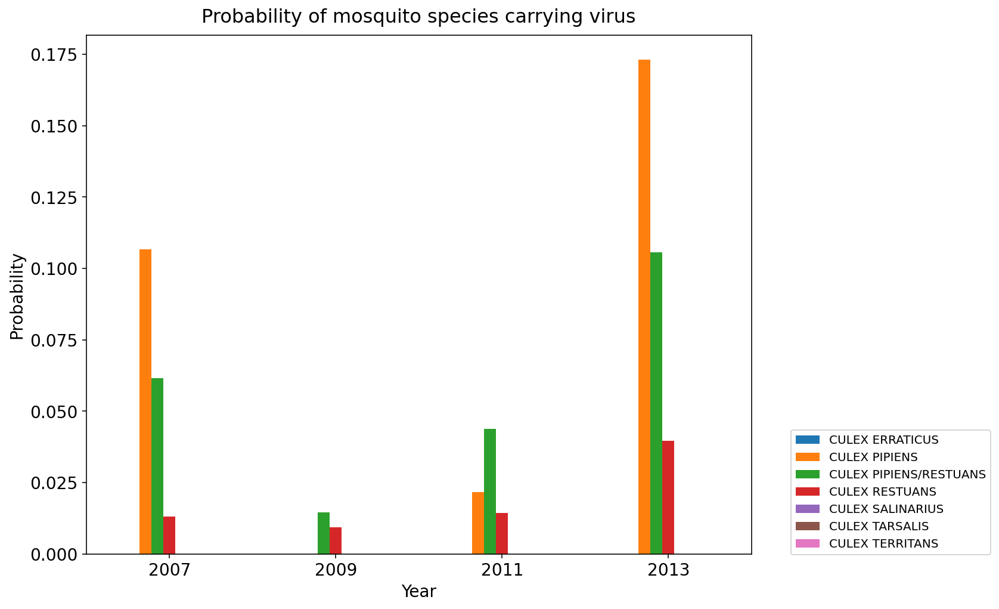

In [36]:
train.groupby(['year','species']).wnvpresent.mean().unstack(fill_value=0).plot.bar(figsize=(10,8));
plt.xticks(rotation=0, fontsize=14);
plt.yticks(fontsize=14);
plt.title('Probability of mosquito species carrying virus', fontsize=16, y=1.01);
plt.ylabel('Probability', fontsize=14);
plt.xlabel('Year',fontsize=14);
plt.legend(fontsize=10, bbox_to_anchor = (1.05, 0.25));
plt.show();
# Most common species of mosquitos caught are Culex Pipiens and Culex Restuans
# Proportion of each species are the same except for 2007

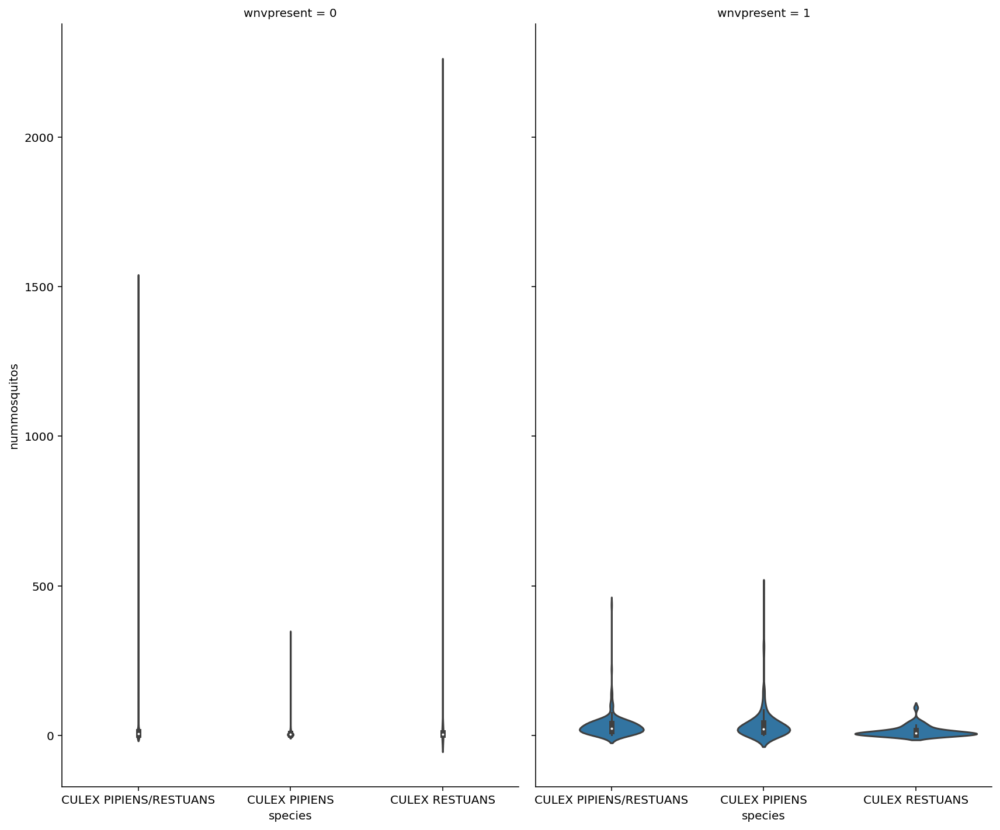

In [37]:
g = sns.FacetGrid(train, col = 'wnvpresent', size=10, aspect = .6);
g.map(sns.violinplot, 'species', 'nummosquitos');

# Shows that there are high proportion of WNV present clusters even when the total num of mosquitoes in the cluster is low

In [38]:
train.columns

Index(['date', 'species', 'trap', 'latitude', 'longitude', 'wnvpresent',
       'nummosquitos', 'year', 'month', 'day', 'precip_avg', '14day_precip',
       '28day_precip', '90day_precip', 'temp_avg', '14day_tavg', '28day_tavg',
       '90day_tavg', 'tmin_avg', '14day_tmin', '28day_tmin', 'tmax_avg',
       '14day_tmax', '28day_tmax', 'dew_avg', '14day_dew', '28day_dew',
       'day_sin', 'day_cos', 'mth_sin', 'mth_cos', 'tmax', 'tmin', 'tavg',
       'depart', 'dewpoint', 'wetbulb', 'heat', 'cool', 'preciptotal',
       'stnpressure', 'sealevel', 'resultspeed', 'resultdir', 'avgspeed',
       'daylight', 'last_rained'],
      dtype='object')

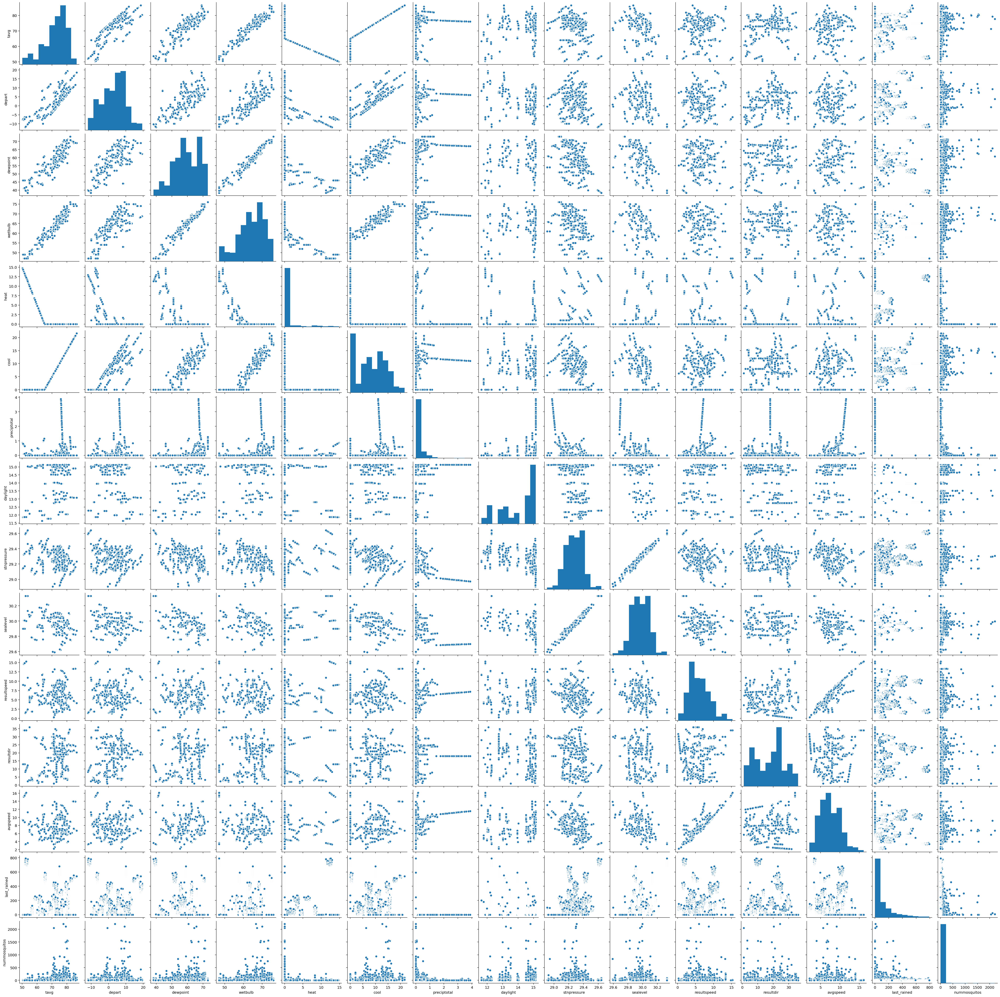

In [39]:
sns.pairplot(train[['tavg', 'depart', 'dewpoint', 'wetbulb',
       'heat', 'cool', 'preciptotal', 'daylight', 'stnpressure',
       'sealevel', 'resultspeed', 'resultdir', 'avgspeed',
       'last_rained', 'nummosquitos']]);

# scatterplots of weather data to num of mosquitos

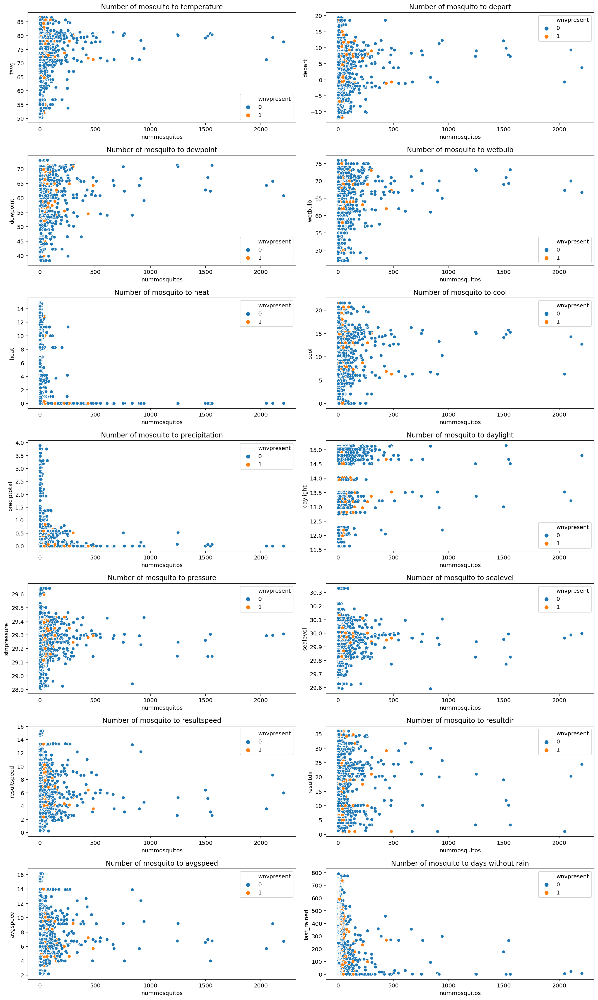

In [40]:
fig,ax = plt.subplots(7, 2, figsize = [15,25]);
ax = ax.ravel()

sns.scatterplot(data=train, y='tavg', x='nummosquitos', ax = ax[0], hue = 'wnvpresent');
ax[0].set_title('Number of mosquito to temperature');
#seems like more mosquito clusters when temperature is higher

sns.scatterplot(data=train, y='depart', x='nummosquitos', ax = ax[1], hue = 'wnvpresent');
ax[1].set_title('Number of mosquito to depart');

sns.scatterplot(data=train, y='dewpoint', x='nummosquitos', ax = ax[2], hue = 'wnvpresent');
ax[2].set_title('Number of mosquito to dewpoint');

sns.scatterplot(data=train, y='wetbulb', x='nummosquitos', ax = ax[3], hue = 'wnvpresent');
ax[3].set_title('Number of mosquito to wetbulb');

sns.scatterplot(data=train, y='heat', x='nummosquitos', ax = ax[4], hue = 'wnvpresent');
ax[4].set_title('Number of mosquito to heat');
# no heat - more mosquitos

sns.scatterplot(data=train, y='cool', x='nummosquitos', ax = ax[5], hue = 'wnvpresent');
ax[5].set_title('Number of mosquito to cool');

sns.scatterplot(data=train, y='preciptotal', x='nummosquitos', ax = ax[6], hue = 'wnvpresent');
ax[6].set_title('Number of mosquito to precipitation');

sns.scatterplot(data=train, y='daylight', x='nummosquitos', ax = ax[7], hue = 'wnvpresent');
ax[7].set_title('Number of mosquito to daylight');
#can't really see much of a correlation between daylight and num of mosquitos

sns.scatterplot(data=train, y='stnpressure', x='nummosquitos', ax = ax[8], hue = 'wnvpresent');
ax[8].set_title('Number of mosquito to pressure');

sns.scatterplot(data=train, y='sealevel', x='nummosquitos', ax = ax[9], hue = 'wnvpresent');
ax[9].set_title('Number of mosquito to sealevel');

sns.scatterplot(data=train, y='resultspeed', x='nummosquitos', ax = ax[10], hue = 'wnvpresent');
ax[10].set_title('Number of mosquito to resultspeed');

sns.scatterplot(data=train, y='resultdir', x='nummosquitos', ax = ax[11], hue = 'wnvpresent');
ax[11].set_title('Number of mosquito to resultdir');

sns.scatterplot(data=train, y='avgspeed', x='nummosquitos', ax = ax[12], hue = 'wnvpresent');
ax[12].set_title('Number of mosquito to avgspeed');

sns.scatterplot(data=train, y='last_rained', x='nummosquitos', ax = ax[13], hue = 'wnvpresent');
ax[13].set_title('Number of mosquito to days without rain');
#can't really see much of a correlation between daylight and num of mosquitos

fig.tight_layout();

We can see certain weather features impact on the number of mosquitos.
The higher the temperature, dewpoint, wetbulb, the more the number of mosquitos.
The lower the heat and precipitation, the more the number of mosquitos.

As we seperate the scatterplots by WNVpresence, we can also tell that there are relationships between WNVpresence and some features. Will explore further in violin plot.

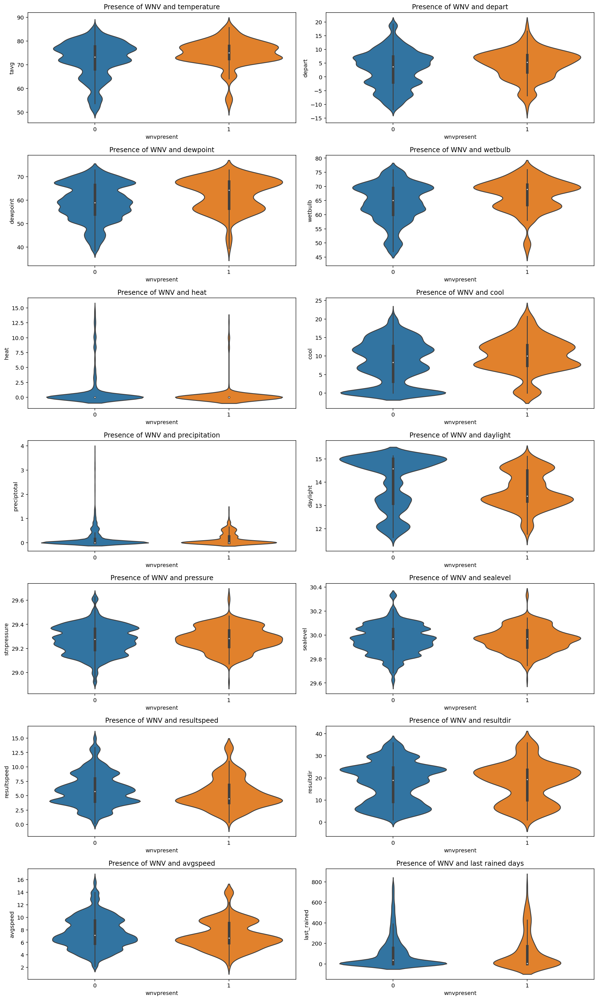

In [41]:
fig,ax = plt.subplots(7, 2, figsize = [15,25]);
ax = ax.ravel()

sns.violinplot(data=train, y='tavg', x='wnvpresent', ax = ax[0]);
ax[0].set_title('Presence of WNV and temperature');

sns.violinplot(data=train, y='depart', x='wnvpresent', ax = ax[1]);
ax[1].set_title('Presence of WNV and depart');

sns.violinplot(data=train, y='dewpoint', x='wnvpresent', ax = ax[2]);
ax[2].set_title('Presence of WNV and dewpoint');

sns.violinplot(data=train, y='wetbulb', x='wnvpresent', ax = ax[3]);
ax[3].set_title('Presence of WNV and wetbulb');

sns.violinplot(data=train, y='heat', x='wnvpresent', ax = ax[4]);
ax[4].set_title('Presence of WNV and heat');

sns.violinplot(data=train, y='cool', x='wnvpresent', ax = ax[5]);
ax[5].set_title('Presence of WNV and cool');

sns.violinplot(data=train, y='preciptotal', x='wnvpresent', ax = ax[6]);
ax[6].set_title('Presence of WNV and precipitation');

sns.violinplot(data=train, y='daylight', x='wnvpresent', ax = ax[7]);
ax[7].set_title('Presence of WNV and daylight');

sns.violinplot(data=train, y='stnpressure', x='wnvpresent', ax = ax[8]);
ax[8].set_title('Presence of WNV and pressure');

sns.violinplot(data=train, y='sealevel', x='wnvpresent', ax = ax[9]);
ax[9].set_title('Presence of WNV and sealevel');

sns.violinplot(data=train, y='resultspeed', x='wnvpresent', ax = ax[10]);
ax[10].set_title('Presence of WNV and resultspeed');

sns.violinplot(data=train, y='resultdir', x='wnvpresent', ax = ax[11]);
ax[11].set_title('Presence of WNV and resultdir');

sns.violinplot(data=train, y='avgspeed', x='wnvpresent', ax = ax[12]);
ax[12].set_title('Presence of WNV and avgspeed');

sns.violinplot(data=train, y='last_rained', x='wnvpresent', ax = ax[13]);
ax[13].set_title('Presence of WNV and last rained days');

fig.tight_layout();

The higher the temperature, dewpoint and wetbulb, the more counts of WNVpresence clusters.
The lower the heat, precipitation and last rained days, the lower the count of WNVpresence clusters.

In [42]:
weather_features1 = ['tavg','dewpoint','wetbulb','preciptotal'] # The higher the value, likely to find WNV presence
# Except preciptotal as preciptotal value is between 0 and 1, squaring it will result in a lower value

weather_features2 = ['heat','last_rained'] # The lower the value, likely to find WNV presence

def weather_engineering(data):
    for col1 in weather_features1:
        data[col1+'engineer'] = data[col1]**2
    
    for col2 in weather_features2:
        data[col2+'engineer'] = data[col2]**0.5

In [43]:
weather_engineering(train) # Engineered the weather features in train
weather_engineering(test) # Engineered the weather features in train

In [44]:
train.head()

,date,species,trap,latitude,longitude,wnvpresent,nummosquitos,year,month,day,...,resultdir,avgspeed,daylight,last_rained,tavgengineer,dewpointengineer,wetbulbengineer,preciptotalengineer,heatengineer,last_rainedengineer
0,2007-05-29,CULEX PIPIENS/RESTUANS,T048,41.867108,-87.654224,0,1,2007,5,29,...,17.382176,6.778021,14.96,1,5614.015778,3399.929221,4265.253990,0.0,0.0,1.000000
1,2007-05-29,CULEX RESTUANS,T048,41.867108,-87.654224,0,2,2007,5,29,...,17.382176,6.778021,14.96,2,5614.015778,3399.929221,4265.253990,0.0,0.0,1.414214
2,2007-05-29,CULEX RESTUANS,T091,41.862292,-87.648860,0,1,2007,5,29,...,17.395157,6.772179,14.96,3,5611.098212,3399.172336,4264.406235,0.0,0.0,1.732051
3,2007-05-29,CULEX RESTUANS,T049,41.896282,-87.655232,0,1,2007,5,29,...,17.270397,6.828322,14.96,4,5639.169668,3406.450075,4272.557298,0.0,0.0,2.000000
4,2007-05-29,CULEX RESTUANS,T153,41.907645,-87.760886,0,1,2007,5,29,...,17.121002,6.895549,14.96,5,5672.875937,3415.175029,4282.328014,0.0,0.0,2.236068


In [45]:
wnv_species = train.groupby('species').sum()[['wnvpresent','nummosquitos']].reset_index()
wnv_species

,species,wnvpresent,nummosquitos
0,CULEX ERRATICUS,0,7
1,CULEX PIPIENS,184,44671
2,CULEX PIPIENS/RESTUANS,225,66268
3,CULEX RESTUANS,48,23431
4,CULEX SALINARIUS,0,145
5,CULEX TARSALIS,0,7
6,CULEX TERRITANS,0,510


In [46]:
wnv_species.sum()

species         CULEX ERRATICUSCULEX PIPIENSCULEX PIPIENS/REST...
wnvpresent                                                    457
nummosquitos                                               135039
dtype: object

In [47]:
wnv_species['proba_wnv'] = wnv_species['wnvpresent'].apply(lambda species : species/457)
wnv_species['proba_num'] = wnv_species['nummosquitos'].apply(lambda species : species/135039)

wnv_species['species_weights'] = (2 * wnv_species['proba_wnv'] * 
                          wnv_species['proba_num']) / (wnv_species['proba_wnv'] + wnv_species['proba_num'])

wnv_species.drop(columns = ['wnvpresent','nummosquitos'], inplace = True)

wnv_species
# weights are the harmonic mean between proba_wnv and proba_sum

,species,proba_wnv,proba_num,species_weights
0,CULEX ERRATICUS,0.000000,0.000052,0.000000
1,CULEX PIPIENS,0.402626,0.330801,0.363196
2,CULEX PIPIENS/RESTUANS,0.492341,0.490732,0.491536
3,CULEX RESTUANS,0.105033,0.173513,0.130855
4,CULEX SALINARIUS,0.000000,0.001074,0.000000
5,CULEX TARSALIS,0.000000,0.000052,0.000000
6,CULEX TERRITANS,0.000000,0.003777,0.000000


In [48]:
train = train.merge(wnv_species, how = 'left', on = 'species')
test = test.merge(wnv_species, how = 'left', on = 'species')
# giving species weights base on probability of WNV and proportion of num of mosquitoes

In [49]:
test.isna().sum()
# species not found in train data

id                         0
date                       0
species                    0
trap                       0
latitude                   0
longitude                  0
year                       0
month                      0
day                        0
precip_avg                 0
14day_precip               0
28day_precip               0
90day_precip               0
temp_avg                   0
14day_tavg                 0
28day_tavg                 0
90day_tavg                 0
tmin_avg                   0
14day_tmin                 0
28day_tmin                 0
tmax_avg                   0
14day_tmax                 0
28day_tmax                 0
dew_avg                    0
14day_dew                  0
28day_dew                  0
day_sin                    0
day_cos                    0
mth_sin                    0
mth_cos                    0
tmax                       0
tmin                       0
tavg                       0
depart                     0
dewpoint      

In [50]:
[x for x in test.species.unique() if x not in set(train.species.unique())]
#check for different unique species (one mosquito is found in test only)

['UNSPECIFIED CULEX']

In [51]:
(test['species']=='UNSPECIFIED CULEX').sum()
# number of unspecified culex in test data

14345

In [52]:
unspecified = test[test['species']=='UNSPECIFIED CULEX'].drop(columns = ['proba_wnv','proba_num','species_weights'])
unspecified.reset_index(drop = True, inplace = True)
unspecified
# need to give unspecified culex weightage

,id,date,species,trap,latitude,longitude,year,month,day,precip_avg,...,resultdir,avgspeed,daylight,last_rained,tavgengineer,dewpointengineer,wetbulbengineer,preciptotalengineer,heatengineer,last_rainedengineer
0,7,2008-06-11,UNSPECIFIED CULEX,T002,41.954690,-87.800991,2008,6,11,0.00,...,18.0,10.247433,15.10,7,5660.630873,3067.101450,4096.000000,0.000000,0.0,2.645751
1,15,2008-06-11,UNSPECIFIED CULEX,T007,41.994991,-87.769279,2008,6,11,0.00,...,18.0,10.252640,15.10,15,5664.549061,3065.659797,4096.000000,0.000000,0.0,3.872983
2,23,2008-06-11,UNSPECIFIED CULEX,T015,41.974089,-87.824812,2008,6,11,0.00,...,18.0,10.280532,15.10,23,5685.561247,3057.942863,4096.000000,0.000000,0.0,4.795832
3,31,2008-06-11,UNSPECIFIED CULEX,T045,41.921600,-87.666455,2008,6,11,0.00,...,18.0,10.165670,15.10,31,5599.281635,3089.784063,4096.000000,0.000000,0.0,5.567764
4,39,2008-06-11,UNSPECIFIED CULEX,T046,41.891118,-87.654491,2008,6,11,0.00,...,18.0,10.142001,15.10,39,5581.584769,3096.365776,4096.000000,0.000000,0.0,6.244998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14340,116260,2014-10-02,UNSPECIFIED CULEX,T237,41.738903,-87.695443,2014,10,2,0.52,...,17.0,7.900000,11.83,0,4693.168908,3762.326284,4011.677503,0.150203,0.0,0.000000
14341,116268,2014-10-02,UNSPECIFIED CULEX,T238,41.753391,-87.707394,2014,10,2,0.52,...,17.0,7.900000,11.83,0,4679.962223,3754.441753,4003.535752,0.140400,0.0,0.000000
14342,116276,2014-10-02,UNSPECIFIED CULEX,T065A,41.777689,-87.749149,2014,10,2,0.52,...,17.0,7.900000,11.83,0,4637.186394,3728.884539,3977.142912,0.110835,0.0,0.000000
14343,116284,2014-10-02,UNSPECIFIED CULEX,T094B,41.719140,-87.669539,2014,10,2,0.52,...,17.0,7.900000,11.83,0,4710.763552,3772.826073,4022.519413,0.163755,0.0,0.000000


In [53]:
test = test[test['species']!='UNSPECIFIED CULEX']
# removing unspecified culex species from test set for the time being

In [54]:
lat_long = train.groupby(['latitude','longitude']).mean()[['proba_wnv','proba_num','species_weights']].reset_index()
lat_long
# to give average weightage across location for unspecified species base on location

,latitude,longitude,proba_wnv,proba_num,species_weights
0,41.644612,-87.604498,0.430635,0.405612,0.416154
1,41.659112,-87.538693,0.350552,0.349800,0.347128
2,41.662014,-87.724608,0.315585,0.318437,0.313508
3,41.673408,-87.599862,0.353696,0.346060,0.346933
4,41.678618,-87.559308,0.319583,0.314433,0.314100
...,...,...,...,...,...
133,42.008314,-87.777921,0.354048,0.357920,0.352725
134,42.009876,-87.807277,0.373688,0.370615,0.369156
135,42.010412,-87.662140,0.321802,0.341536,0.328304
136,42.011601,-87.811506,0.352950,0.353864,0.350147


In [55]:
unspecified = pd.merge(unspecified, lat_long, on = ['latitude','longitude'], how = 'left')
# giving unspecified species weightage base on location

In [56]:
test = pd.concat([test,unspecified])
# Adding unspecified culex species back

In [57]:
test.isna().sum()
# will need to give these nan values weights

id                        0
date                      0
species                   0
trap                      0
latitude                  0
longitude                 0
year                      0
month                     0
day                       0
precip_avg                0
14day_precip              0
28day_precip              0
90day_precip              0
temp_avg                  0
14day_tavg                0
28day_tavg                0
90day_tavg                0
tmin_avg                  0
14day_tmin                0
28day_tmin                0
tmax_avg                  0
14day_tmax                0
28day_tmax                0
dew_avg                   0
14day_dew                 0
28day_dew                 0
day_sin                   0
day_cos                   0
mth_sin                   0
mth_cos                   0
tmax                      0
tmin                      0
tavg                      0
depart                    0
dewpoint                  0
wetbulb             

In [58]:
print(lat_long['species_weights'].mean())
print(lat_long['proba_num'].mean())
print(lat_long['proba_wnv'].mean())
# average weights of each lat and long

0.35494877340375386
0.35647332725707237
0.35936799249768125


In [59]:
test['species_weights'].fillna(lat_long['species_weights'].mean(), inplace = True)
test['proba_num'].fillna(lat_long['proba_num'].mean(), inplace = True)
test['proba_wnv'].fillna(lat_long['proba_wnv'].mean(), inplace = True)
# Fill in average weights for those species that does not have similiar lat and long

In [60]:
test.isna().sum()
# Filled up all the nan values

id                     0
date                   0
species                0
trap                   0
latitude               0
longitude              0
year                   0
month                  0
day                    0
precip_avg             0
14day_precip           0
28day_precip           0
90day_precip           0
temp_avg               0
14day_tavg             0
28day_tavg             0
90day_tavg             0
tmin_avg               0
14day_tmin             0
28day_tmin             0
tmax_avg               0
14day_tmax             0
28day_tmax             0
dew_avg                0
14day_dew              0
28day_dew              0
day_sin                0
day_cos                0
mth_sin                0
mth_cos                0
tmax                   0
tmin                   0
tavg                   0
depart                 0
dewpoint               0
wetbulb                0
heat                   0
cool                   0
preciptotal            0
stnpressure            0


In [61]:
((train.groupby('month').sum()[['wnvpresent']])/457).reset_index().rename(columns = {'wnvpresent':'month_weight'})
# probability in months

,month,month_weight
0,5,0.000000
1,6,0.002188
2,7,0.089716
3,8,0.663020
4,9,0.240700
5,10,0.004376


In [62]:
train = train.merge(((train.groupby('month').sum()[['wnvpresent']])
             /457).reset_index().rename(columns = {'wnvpresent':'month_weight'}),
                    how = 'left', on = 'month')

test = test.merge(((train.groupby('month').sum()[['wnvpresent']])
             /457).reset_index().rename(columns = {'wnvpresent':'month_weight'}),
                    how = 'left', on = 'month')

# months weightage included

In [63]:
for_map = train.groupby(['latitude','longitude']).mean()[['nummosquitos','wnvpresent']].reset_index()
for_map

,latitude,longitude,nummosquitos,wnvpresent
0,41.644612,-87.604498,8.600000,0.066667
1,41.659112,-87.538693,18.074468,0.074468
2,41.662014,-87.724608,20.405229,0.052288
3,41.673408,-87.599862,137.139241,0.094937
4,41.678618,-87.559308,13.544554,0.009901
...,...,...,...,...
133,42.008314,-87.777921,23.200000,0.078261
134,42.009876,-87.807277,15.469388,0.122449
135,42.010412,-87.662140,1.920635,0.000000
136,42.011601,-87.811506,14.859649,0.087719


In [64]:
for_map.sort_values(by='wnvpresent', ascending = False)

,latitude,longitude,nummosquitos,wnvpresent
131,41.999129,-87.795585,8.214286,0.178571
125,41.990284,-87.797127,4.458333,0.166667
119,41.974689,-87.890615,84.538462,0.159341
8,41.688324,-87.676709,27.333333,0.145833
116,41.970248,-87.787992,13.000000,0.142857
...,...,...,...,...
78,41.891118,-87.654491,5.811321,0.000000
79,41.891126,-87.611560,2.571429,0.000000
85,41.907645,-87.760886,6.736842,0.000000
90,41.919343,-87.694259,4.250000,0.000000


In [65]:
def most_deadly1(data):
    deadly1 = (41.999129,-87.795585)
    location_trap = (data.latitude, data.longitude)  
    return distance.distance(deadly1, location_trap).km

def most_deadly2(data):    
    deadly2 = (41.990284,-87.797127)
    location_trap = (data.latitude, data.longitude)
    return distance.distance(deadly2, location_trap).km

def most_deadly3(data):    
    deadly3 = (41.974689,-87.890615)
    location_trap = (data.latitude, data.longitude)
    return distance.distance(deadly3, location_trap).km

def most_deadly4(data):    
    deadly4 = (41.688324,-87.676709)
    location_trap = (data.latitude, data.longitude)
    return distance.distance(deadly4, location_trap).km

# functions to get the distance away from the top 4 deadliest spots

In [66]:
train['dead1'] = train.apply(most_deadly1, axis = 1)
train['dead2'] = train.apply(most_deadly2, axis = 1)
train['dead3'] = train.apply(most_deadly3, axis = 1)
train['dead4'] = train.apply(most_deadly4, axis = 1)

test['dead1'] = test.apply(most_deadly1, axis = 1)
test['dead2'] = test.apply(most_deadly2, axis = 1)
test['dead3'] = test.apply(most_deadly3, axis = 1)
test['dead4'] = test.apply(most_deadly4, axis = 1)
# Adding 4 deadliest hotspots for WNV positive

In [67]:
px.scatter_mapbox(data_frame=for_map, lat='latitude', lon='longitude', size='nummosquitos',
                  color='nummosquitos',mapbox_style="carto-positron", color_continuous_scale='reds', size_max=50, zoom=10,
                 title='Locations with mosquito clusters')

In [68]:
px.density_mapbox(data_frame=for_map, lat='latitude', lon='longitude',
                  z='nummosquitos',mapbox_style="carto-positron", color_continuous_scale='reds', zoom=10,
                 title = 'HeatMap of mosquito clusters')

In [69]:
px.scatter_mapbox(data_frame=for_map, lat='latitude', lon='longitude', size='wnvpresent',
                  color='wnvpresent',mapbox_style="carto-positron", color_continuous_scale='reds', size_max=30, zoom=10,
                 title = 'Colorscale of WNV presence in mosquito clusters')

In [70]:
px.density_mapbox(data_frame=for_map, lat='latitude', lon='longitude',
                  z='wnvpresent',mapbox_style="carto-positron", color_continuous_scale='reds', zoom=10,
                 title = 'HeatMap of WNV presence in mosquito clusters')

In [71]:
train.to_csv('../assets/train_engineered.csv', index = False)
test.to_csv('../assets/test_engineered.csv', index = False)